In [403]:
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
import heapq
import itertools
import copy
import os
import seaborn as sns
import pandas as pd
import cv2

In [404]:
pretrained_model = "checkpoint_model.pth" #事前学習済みMNISTモデル(重みパラメータ)
use_cuda = True

In [405]:
# LeNet Model 定義
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, 1)
        self.conv2 = nn.Conv2d(32, 64, 3, 1)
        self.dropout1 = nn.Dropout(0.25)
        self.dropout2 = nn.Dropout(0.5)
        self.fc1 = nn.Linear(9216, 128)
        self.fc2 = nn.Linear(128, 10)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = F.max_pool2d(x, 2)
        x = self.dropout1(x)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.fc2(x)
        output = F.log_softmax(x, dim=1)
        return output

# MNISTのTest datasetと dataloaderの定義
test_loader = torch.utils.data.DataLoader(
    datasets.MNIST('../data', train=False, download=True, transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.5,), (0.5,))
            ])), 
        batch_size=1, shuffle=False)

# 使うデバイス（CPUかGPUか）の定義
print("CUDA Available: ",torch.cuda.is_available())
device = torch.device("cuda" if (use_cuda and torch.cuda.is_available()) else "cpu")

# ネットワークの初期化
model = Net().to(device)
print(model)
# 訓練済みモデルのロード
model.load_state_dict(torch.load(pretrained_model, map_location='cpu'))


# モデルを評価モードに設定。本チュートリアルの例では、これはドロップアウト層等を評価モードにするのに必要
model.eval()

CUDA Available:  True
Net(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (dropout1): Dropout(p=0.25, inplace=False)
  (dropout2): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=9216, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)


Net(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (dropout1): Dropout(p=0.25, inplace=False)
  (dropout2): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=9216, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)

In [406]:
def im_is_black(image):
    if image < torch.Tensor([0]).to("cuda"):
        return True
    else:
        return False

In [407]:
def im_is_white(image):
    if image >= torch.Tensor([0]).to("cuda"):
        return True
    else:
        return False

In [408]:
def character_search(image):
    image_copy = copy.deepcopy(image)
    for x in range(28):
        for y in range(28):
            if im_is_black(image[x][y]):
                for i in range(-1, 2):
                    for j in range(-1, 2):
                        if (x + i != -1) and (x + i != 28) and (y + j != -1) and (y + j != 28):
                            if im_is_white(image[x + i][y + j]):
                                image_copy[x][y] = torch.Tensor([1]).to("cuda")
                                break
                    else:
                        continue
                    break
                else:
                    image_copy[x][y] = torch.Tensor([0]).to("cuda")
            elif im_is_white(image[x][y]):
                for i in range(-1, 2):
                    for j in range(-1, 2):
                        if (x + i != -1) and (x + i != 28) and (y + j != -1) and (y + j != 28):
                            if im_is_black(image[x + i][y + j]):
                                image_copy[x][y] = torch.Tensor([1]).to("cuda")
                                break
                    else:
                        continue
                    break
                else:
                    image_copy[x][y] = torch.Tensor([0]).to("cuda")
    image_chain = list(itertools.chain.from_iterable(image_copy))
    return image_chain

In [409]:
def attack(image, data_grad, max_index_list, img_copy):
    stop = 0
    data_grad_chain = list(itertools.chain.from_iterable(data_grad[0][0]))
    character_coordinate = character_search(img_copy.data[0][0])
    for i in range(784):
        if character_coordinate[i] == torch.Tensor([0]).to("cuda"):
            data_grad_chain[i] = torch.Tensor([0]).to("cuda")
    for j in max_index_list:
        data_grad_chain[j] = torch.Tensor([0]).to("cuda")
    grad_sorted = sorted(list(map(abs, data_grad_chain)), reverse=True)
    for k in grad_sorted:
        grad_max_index = list(map(abs, data_grad_chain)).index(k)
        image.requires_grad = False
        if (data_grad_chain[grad_max_index] > 0 and image[0][0][grad_max_index // 28][grad_max_index - 28 * (grad_max_index // 28)] < 0) or (data_grad_chain[grad_max_index] < 0 and image[0][0][grad_max_index // 28][grad_max_index - 28 * (grad_max_index // 28)] > 0):
            image[0][0][grad_max_index // 28][grad_max_index - 28 * (grad_max_index // 28)] *= -1
            max_index_list.append(grad_max_index)
            break
    else:
        stop = 1
    return image, max_index_list, stop

In [410]:
def test( model, device, test_loader):

    # 精度カウンター
    correct = 0
    # count = 0
    count_list = [0] * 10

    adv_examples = []
    # i=0
    dirname_grad = "../org+adv/grad/"
    dirname_org = "../org+adv/org/"
    dirname_adv_T = "../org+adv/adv_T/"
    dirname_adv = "../org+adv/adv/"


    # テスト用データセット内の全てのサンプルをループします
    for data, target in test_loader:
        
        # i+=1
        # if i==150:
        #     break
        # データとラベルをデバイス（CPUもしくはGPU）に送信します
        data, target = data.to(device), target.to(device)
        data = (data >= torch.Tensor([0]).to("cuda")).float() - (data < torch.Tensor([0]).to("cuda")).float()

        # テンソルの requires_grad 属性を設定します。攻撃者にとっては重要な設定です。
        data.requires_grad = True

        # データをモデルに順伝播させます
        output = model(data)
        init_pred = output.max(1, keepdim=True)[1] # 最大の確率のインデックスを取得します。

        # 最初から予測が間違っている場合、攻撃する必要がないため次のイテレーションに進みます。
        if init_pred.item() != target.item() or init_pred.item() != 9:
            continue

        data_copy = data.detach().clone()
        for j in [dirname_grad, dirname_org, dirname_adv_T, dirname_adv]:
                    for k in ["0/", "1/", "2/", "3/", "4/", "5/", "6/", "7/", "8/", "9/"]:
                        os.makedirs(j + k, exist_ok=True)

        # count += 1
        # print(count)
        # if count <= 433:
        #     continue
        count_list[init_pred.item()] += 1
        print(count_list[init_pred.item()])


        for px in range(1, 31):
            data.requires_grad = True
            # 損失を計算します
            loss = F.nll_loss(output, target)
            # 既存の勾配を全てゼロにします
            model.zero_grad()
            # 逆伝播させてモデルの勾配を計算します
            loss.backward()
            # データの勾配を取得します
            data_grad = data.grad.data
            if px == 1:
                max_index = []
            perturbed_data, max_index, stop = attack(data, data_grad, max_index, data_copy)
            output = model(perturbed_data)
            pred = output.max(1, keepdim=True)[1]
            data = perturbed_data
            if px == 1:
                #勾配のヒートマップ
                grad_map = data_grad.squeeze().detach().cpu().numpy()
                grad_map_abs = np.abs(grad_map)
                plt.xticks([], [])
                plt.yticks([], [])
                plt.imsave(dirname_grad + "{}/{}.png".format(init_pred.item(), count_list[init_pred.item()]), grad_map_abs, cmap="Reds")
                
                
                #勾配の絶対値のグラフ
                sns.set()
                sns.set_style('whitegrid')
                sns.set_palette('gray')
                data_grad = data_grad.cpu()
                data_grad = list(list(map(abs, itertools.chain.from_iterable(data_grad[0][0]))))
                data_grad.sort(reverse=True)
                x = np.array(list(range(1, 785)))
                y = np.array(data_grad)
                fig = plt.figure()
                ax = fig.subplots()
                ax.plot(x, y)
                ax.set_xlabel('absolute gradient rank')
                ax.set_ylabel('absolute gradient')
                fig.savefig(dirname_grad + "{}/graph{}.png".format(init_pred.item(), count_list[init_pred.item()]))
            if pred.item() != target.item():
                break
            elif stop == 1:
                print(stop)
                break
        
        final_pred = pred

        org = data_copy.squeeze().detach().cpu().numpy()
        adv = perturbed_data.squeeze().detach().cpu().numpy()
        

        #各条件を満たす画像の保存
        plt.xticks([], [])
        plt.yticks([], [])
        plt.imsave(dirname_org + "{}/{}.png".format(init_pred.item(), count_list[init_pred.item()]), org, cmap="gray")
        
        
        os.makedirs(dirname_adv + "{}/{}→{}/".format(init_pred.item(), init_pred.item(), final_pred.item()), exist_ok=True)
        plt.xticks([], [])
        plt.yticks([], [])
        plt.imsave(dirname_adv + "{}/{}→{}/{}.png".format(init_pred.item(), init_pred.item(), final_pred.item(), count_list[init_pred.item()]), adv, cmap="gray")


        if (final_pred.item() != target.item()):
            # あとで可視化するために敵対的サンプルのうちいくつかを保存
            if len(adv_examples) < 25:
                adv_examples.append( (init_pred.item(), final_pred.item(), org, adv))
                # if len(adv_examples) == 25:
                #     break


    # epsilonごとの最終的な精度を算出
    final_acc = correct/float(len(test_loader))
    print("Test Accuracy = {} / {} = {}".format(correct, len(test_loader), final_acc))

    # 精度と敵対的サンプルを返却
    return final_acc, adv_examples

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


/tmp/ipykernel_5818/4041450002.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290

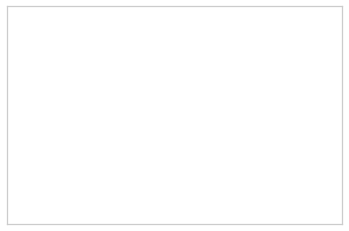

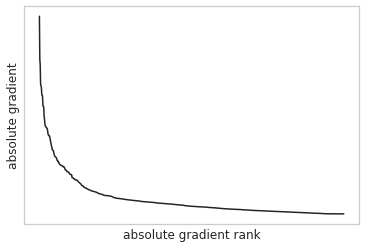

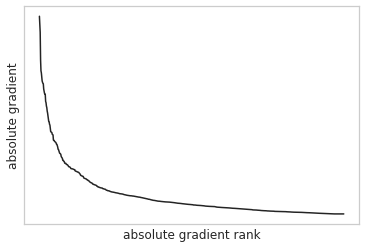

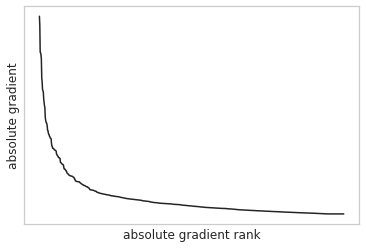

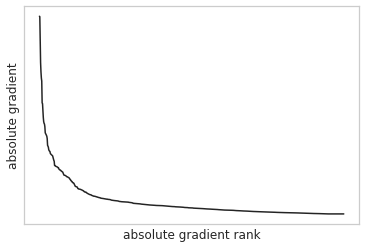

...

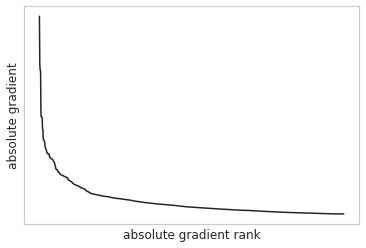

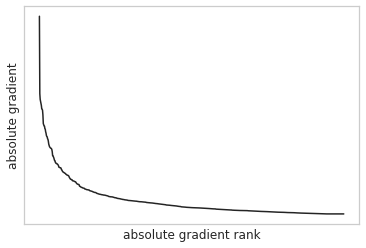

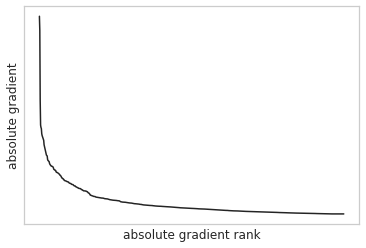

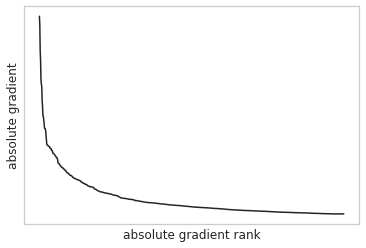

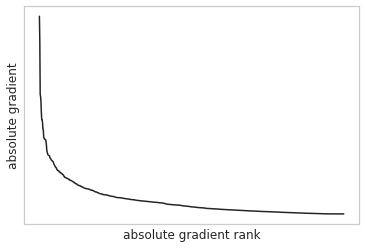

In [411]:
accuracies = []
examples = []

# 各epsilonごとにテストを実行
acc, ex = test(model, device, test_loader)
accuracies.append(acc)
examples.append(ex)

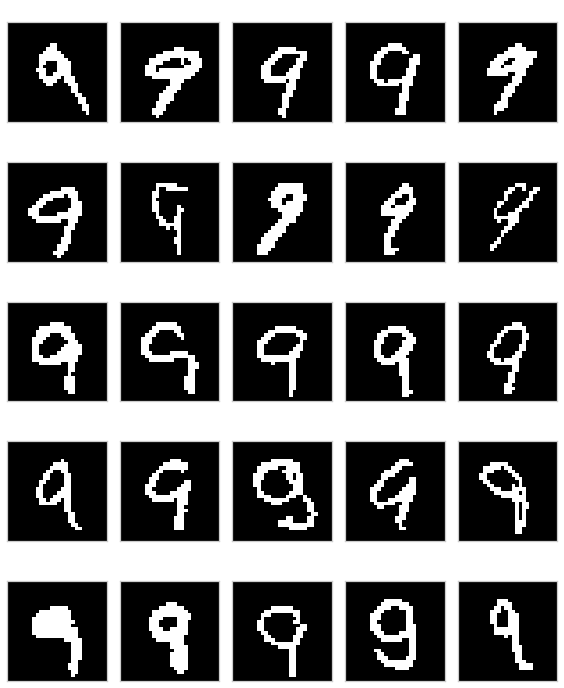

In [412]:
cnt = 0
plt.figure(figsize=(8,10))

for j in range(len(examples[0])):
    cnt += 1
    plt.subplot(5,5,cnt)
    plt.xticks([], [])
    plt.yticks([], [])
    orig,adv, org_ex, adv_ex = examples[0][j]
    plt.title("{}".format(orig), color="white")
    plt.imshow(org_ex, cmap="gray")
plt.tight_layout()
plt.show()

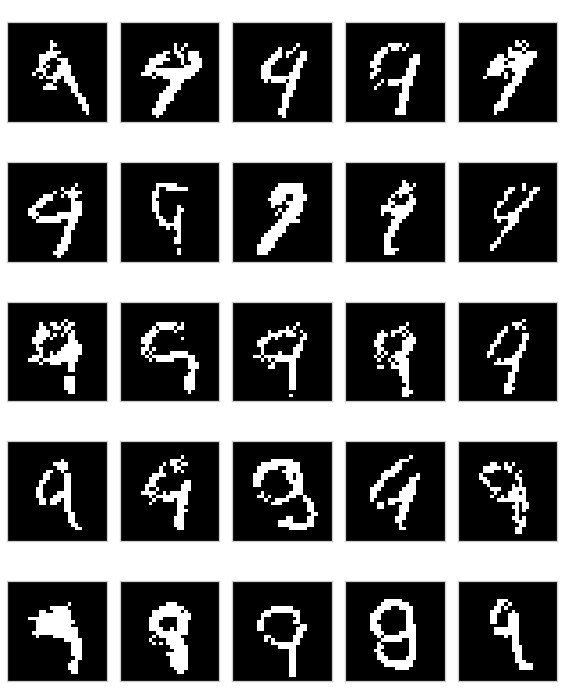

In [413]:
cnt = 0
plt.figure(figsize=(8,10))

for j in range(len(examples[0])):
    cnt += 1
    plt.subplot(5,5,cnt)
    plt.xticks([], [])
    plt.yticks([], [])
    orig, adv, org_ex, adv_ex = examples[0][j]
    plt.title("{} -> {}".format(orig, adv), color="white")
    plt.imshow(adv_ex, cmap="gray")
plt.tight_layout()
plt.show()